# Projet de fin d'étude (PFE) : Classification De Sons de Percussions

Un projet réalisé par [Mlamali SAID SALIMO](https://www.linkedin.com/in/mlamalisaidsalimo/), étudiant-ingénieur en IA, à CY Tech.


## Sommaire

Ce projet est divisé en six notebooks, chacun dédié à une étape spécifique du développement de notre outil de classification audio.

- **[1 Introduction & Data Preparation.ipynb](./1.%20Introduction%20%26%20Data%20Preparation.ipynb)** : *Présentation du projet et préparation des données pour les étapes ultérieures.*
- **[2. Features Extraction - Hand-crafted Features.ipynb](./2.%20Features%20Extraction%20-%20Hand-crafted%20Features.ipynb)** : *Extraction de caractéristiques audio pertinentes pour la classification.*
- **[3. Data Cleaning.ipynb](./3.%20Data%20Cleaning.ipynb)** : *Nettoyage des données pour garantir leur fiabilité lors de l'entraînement de nos modèles.*
- **[4. Exploratory Data Analysis (EDA).ipynb](./4.%20Exploratory%20Data%20Analysis%20%28EDA%29.ipynb)** : *Analyse exploratoire des données pour en comprendre les caractéristiques et les tendances.*
- **[5. Data Augmentation.ipynb](./5.%20Data%20Augmentation.ipynb)** : *Augmentation de nos données pour améliorer la robustesse de notre modèle de classification.*
- **[6. ML Models & Conclusion.ipynb](./6.%20ML%20Models%20%26%20Conclusion.ipynb)** : *Entraînement de modèles d'apprentissage automatique pour la classification des sons de percussion.*

# Notebook (2) - "Feature Extraction - Hand-crafted Features"

Dans ce notebook, nous nous attelons à l'extraction des caractéristiques essentielles des fichiers audio de notre ensemble de données. La richesse et la diversité de ces informations, issues tant du domaine temporel que fréquentiel, sont cruciales pour la performance de notre futur modèle de classification.

Nous explorons une gamme étendue de caractéristiques, comme la durée, le taux de franchissement de zéro, le centroïde temporel ou encore l'enveloppe du son dans le domaine temporel. Dans le domaine fréquentiel, nous nous intéressons à la hauteur tonale, aux coefficients cepstraux de fréquence mel (MFCC), aux caractéristiques de chroma, et à diverses caractéristiques spectrales comme le centroïde spectral ou le contraste spectral. Chaque étape d'extraction est visuellement illustrée pour faciliter la compréhension. À la fin, nous sauvegardons l'ensemble de données enrichi pour une utilisation ultérieure.

## Caractériques des audios

Dans le monde numérique, un son est capturé par un microphone et transformé en une série de nombres qui reflètent les fluctuations de pression d'air au fil du temps.

![500](../images/img_12.png)

Cette représentation du son est ce que nous appelons le **domaine temporel** du son. Vous l'avez probablement déjà vu.

Mais les sons sont plus que de simples variations de pression dans le temps. Ils sont constitués d'un mélange complexe de différentes fréquences. Pour révéler ces fréquences, nous transformons le son dans le **domaine fréquentiel**, qui nous donne une autre perspective : un spectrogramme. Ce dernier sépare le signal en différentes bandes de fréquences, nous montrant la quantité d'énergie.

![](../images/audio viz examples - Kick 20230515.png)

En observant ces représentations, on remarque déjà certaines particularités. Par exemple
Les formes d'onde des 'snares' semblent plus "diffuses" et montrent une énergie répartie sur l'ensemble du spectre.
Les 'kicks', quant à eux, sont clairement plus puissants dans les basses fréquences, comme le montrent les pics autour de 64 Hz.

Ces observations montrent bien comment **chaque type de son a sa propre 'empreinte'** dans le domaine temporel et fréquentiel. C'est cette diversité que nous allons essayer de décrire puis exploiter avec le Machine Learning pour distinguer les différents types de sons.

## Parametres

Avant de procéder à l'extraction des caractéristiques, nous devons d'abord définir certains paramètres essentiels qui influenceront la manière dont les caractéristiques sont extraites de nos fichiers audio. Ces paramètres sont utilisés tout au long du notebook pour assurer une cohérence dans nos analyses.

- `N_MFCC` : Ce paramètre représente le nombre de coefficients cepstraux de fréquence Mel (MFCC) que nous souhaitons extraire. Les MFCC sont une représentation compacte du spectre de puissance d'un son, très utilisée en reconnaissance vocale et musicale. Un nombre typique de coefficients MFCC à extraire est généralement compris entre 10 et 20, ici nous avons choisi 12.

- `N_FFT` : C'est la taille de la fenêtre pour la Transformée de Fourier à Court Terme (STFT). Une STFT est utilisée pour décomposer un signal complexe en ses composantes de fréquence. Dans notre cas, nous avons choisi une taille de fenêtre de 2048.

- `RMS_FRAME_LENGTH` et `ZCR_FRAME_LENGTH`: Ces paramètres définissent la longueur de la fenêtre pour le calcul de la valeur efficace (RMS) et du taux de franchissement de zéro (ZCR) respectivement. Ils sont fixés à 1024 dans notre cas.

- `HOP_LENGTH` : C'est le nombre d'échantillons entre les fenêtres successives lors du calcul des caractéristiques. Nous avons choisi une longueur de pas de 512.

In [51]:
N_MFCC = 12  #10-20
N_FFT = 2048
RMS_FRAME_LENGTH = ZCR_FRAME_LENGTH = 1024
HOP_LENGTH = 512

## Imports

### Librairies

In [52]:
import IPython.display as ipd
from scipy.signal import hilbert
import numpy as np
import pandas as pd
import scipy
from scipy.stats import skew
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

import tools

# change style
plt.style.use('ggplot')
import librosa
import librosa.display
from tqdm import tqdm
from datetime import datetime

tqdm.pandas()
import os
from glob import glob
import random
from typing import List, Tuple, Dict

from concurrent.futures import ThreadPoolExecutor, as_completed
import threading

In [53]:
from params import SOUNDS_DATASET_PATH, SAMPLE_RATE, CLASS_COLORS
from tools import play_audio, load_audio_file, pad_signal
from extract_audio_features import *

### Audios Dataset

#### Load Dataset

In [54]:
dataset_csv_path = os.path.join(SOUNDS_DATASET_PATH, 'dataset.csv')

dataset = pd.read_csv(dataset_csv_path)
dataset

,file_path,file_name,file_extension,class,split
0,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,Shaker (86),.wav,Shaker,train
1,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,shaker (2) (2),.wav,Shaker,train
2,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,Shaker (85),.wav,Shaker,train
3,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,Shaker 2 (6),.wav,Shaker,train
4,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,PBJ Perc - Shaker,.wav,Shaker,train
...,...,...,...,...,...
10298,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,Hi Seed Shaker 3,.aif,Shaker,train
10299,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,Hi Seed Shaker 2,.aif,Shaker,train
10300,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,Mid Seed Shaker 6,.aif,Shaker,train
10301,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,Lo Seed Shaker 3,.aif,Shaker,test


In [55]:
dataset['class'].unique()  # todo créer dictionnaire de couples fmin fmax

array(['Shaker', 'Bell', '808', 'Snap', 'Kick', 'Hat Open (Cymbal)',
       'Ride (Cymbal)', 'Crash (Cymbal)', 'Hat Closed (Cymbal)', 'Metal',
       'Conga', 'Tom', 'Clap', 'Snare'], dtype=object)

On va réduire le nombre le nombre de classe pour éviter d'avoir un dataset trop grand pour faire nos tests.

In [56]:
# suffle dataset and get 100 examples per class #todo comment this cell
dataset = dataset.sample(frac=1).reset_index(drop=True)
# select only class in ['Snare', 'Kick', 'Hat Closed (Cymbal)', 'Tom', 'Hat Open (Cymbal)', 'Crash (Cymbal)', "Kick", "808"]
dataset = dataset[dataset['class'].isin(
    ['Snare', "Clap", "Conga", "808", 'Kick', 'Hat Closed (Cymbal)', "Hat Open (Cymbal)", 'Tom', 'Crash (Cymbal)'])]
dataset = dataset.groupby('class').sample(50)
dataset

,file_path,file_name,file_extension,class,split
1544,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,NM - Teapot 808,.wav,808,train
5247,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,808Star (20),.wav,808,test
7046,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,VACCINE - 808 - 002,.wav,808,train
7056,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,Simple but Good,.wav,808,train
8405,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,NM - Jumanji (808),.wav,808,train
...,...,...,...,...,...
3479,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,Tom 0117 E,.flac,Tom,test
6760,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,Tom 0155,.flac,Tom,train
117,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,Tom 0266,.flac,Tom,train
9920,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,Tom 0209,.flac,Tom,train


#### Set Examples Audio

On va sélectionner 5 exemples par classe. Ces exemples nous serons utile pour visualiser et comprendre les caractéristiques extraites.

In [57]:
N_EXAMPLES = 3

# load audio file of each example
y_sr_examples = {file_path: load_audio_file(file_path) for file_path in
                 dataset.groupby('class').head(N_EXAMPLES)['file_path']}

# apply pad_signal to each example
y_sr_examples = {file_path: (pad_signal(y=y, target_length=N_FFT), sr) for file_path, (y, sr) in y_sr_examples.items()}

# class of each example in y_sr_examples
class_examples = {file_path: class_name for file_path, class_name in
                  zip(dataset.groupby('class').head(N_EXAMPLES)['file_path'],
                      dataset.groupby('class').head(N_EXAMPLES)['class'])}

pd.DataFrame.from_dict(y_sr_examples, orient='index', columns=['y', 'sr'])

,y,sr
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\808\NM - Teapot 808.wav,"[-1.0102958e-06, -3.7599941e-06, -8.275505e-06...",44100
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\808\808Star (20).wav,"[-0.07258606, -0.056167603, -0.0393219, -0.022...",44100
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\808\VACCINE - 808 - 002.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",44100
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Clap\Clap 0868.flac,"[0.0, -0.007095337, 0.020233154, 0.058792114, ...",44100
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Clap\Clap 0835.flac,"[1.5258789e-05, 0.0, -1.5258789e-05, 7.6293945...",44100
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Clap\Clap 0477.flac,"[-0.034622192, -0.07141113, -0.12649536, -0.08...",44100
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Conga\Conga 0115.flac,"[0.00039672852, 0.00045776367, 9.1552734e-05, ...",44100
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Conga\Conga 0048.flac,"[0.0, 0.011962891, 0.031585693, 0.05328369, 0....",44100
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Conga\Conga 0220.flac,"[0.00018310547, -0.00033569336, -0.00061035156...",44100
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Crash (Cymbal)\Crash 0219 B.flac,"[0.00015258789, 3.0517578e-05, 0.03475952, 0.0...",44100


## Caractéristiques dans le domaine temporel

Les caractéristiques temporelles (Time-domain Features) sont des caractéristiques qui peuvent être extraites directement à partir du signal audio brut. Elles sont généralement calculées sur de petites fenêtres de temps, appelées trames, qui se chevauchent. Les caractéristiques temporelles sont généralement utilisées pour décrire les propriétés temporelles d'un signal audio, comme son volume, sa hauteur, sa durée, etc.


### Durée

La durée d'un signal audio est simplement le temps écoulé entre le début et la fin du signal. Elle est mesurée en secondes. La durée d'un signal audio peut être calculée à l'aide de la fonction `get_duration` de la librairie `librosa`.

In [58]:
# afficher la durée de quelques exemples
for file_path, (y, sr) in list(y_sr_examples.items())[:10]:
    print(f'duration: {librosa.get_duration(y=y, sr=sr):.3f} - {file_path}')

duration: 11.569 - G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\808\NM - Teapot 808.wav
duration: 1.500 - G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\808\808Star (20).wav
duration: 2.848 - G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\808\VACCINE - 808 - 002.wav
duration: 1.613 - G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Clap\Clap 0868.flac
duration: 0.336 - G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Clap\Clap 0835.flac
duration: 0.385 - G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Clap\Clap 0477.flac
duration: 0.419 - G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Conga\Conga 0115.flac
duration: 0.300 - G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Conga\Conga 0048.flac
duration: 0.680 - G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Conga\Conga 0220.flac
duration: 7.656 - G:\Share

### Root Mean Square (RMS)

Le Root Mean Square (RMS, en français "Moyenne quadratique") est une mesure de l'amplitude moyenne du signal, qui peut être interprétée comme une mesure de l'énergie ou du volume du son. Pour le calculer, nous divisons le son en petites sections ou “fenêtres". Pour chaque fenêtre, nous calculons le RMS.

On peut alors obtenir plusieurs statistiques sur les valeurs RMS calculées, telles que la moyenne, le maximum, l'écart-type, facteur de crête (crest factor), etc. Ces statistiques peuvent être utilisées comme caractéristiques pour la classification audio pour distinguer les sons en fonction de leur énergie ou de leur volume. Par exemple, les sons de percussion tels que les caisses claires et les grosses caisses ont généralement une énergie plus élevée que les sons de guitare acoustique.


Notez que l'utilisation du logarithme n'est pas obligatoire. Il est possible d'utiliser le RMS brut comme caractéristique. Cependant, l'utilisation du logarithme est recommandée car elle améliore les performances de classification. En effet, l'utilisation du logarithme dans un problème de classification audio a plusieurs avantages

#### Avantages du logarithme

- **Perception auditive**: Le logarithme RMS, correspondant à notre perception non linéaire du volume, traduit plus fidèlement l'intensité sonore.
- **Normalisation**: Le logarithme restreint la variabilité de RMS, facilitant la comparaison entre différents signaux et optimisant la classification.
- **Précision numérique**: Le logarithme gère la dynamique de signaux audio en évitant les problèmes de sous-échantillonnage.


In [59]:
# exemple de calcul du RMS
librosa.feature.rms(y=list(y_sr_examples.values())[0][0], frame_length=RMS_FRAME_LENGTH, hop_length=HOP_LENGTH)

array([[1.49941713e-01, 4.47070688e-01, 6.85571671e-01, 7.11871624e-01,
        5.72324932e-01, 3.57228100e-01, 2.83270568e-01, 3.42093855e-01,
        3.14689606e-01, 3.36140096e-01, 2.78354496e-01, 2.81791359e-01,
        3.27532768e-01, 2.31872231e-01, 2.84182250e-01, 3.19155931e-01,
        2.81792372e-01, 3.13708007e-01, 2.61831820e-01, 2.86207259e-01,
        3.26286674e-01, 2.24180862e-01, 2.78243393e-01, 3.23978484e-01,
        2.71800607e-01, 3.08707207e-01, 2.80008465e-01, 2.90484041e-01,
        3.24514687e-01, 2.21770048e-01, 2.75143206e-01, 3.26693445e-01,
        2.59902567e-01, 3.02200198e-01, 2.95756102e-01, 2.93006182e-01,
        3.22245836e-01, 2.25462988e-01, 2.75353730e-01, 3.27708721e-01,
        2.47715473e-01, 2.94976532e-01, 3.07797194e-01, 2.90825337e-01,
        3.19354415e-01, 2.37319276e-01, 2.78726041e-01, 3.27797830e-01,
        2.36173272e-01, 2.87244171e-01, 3.16414684e-01, 2.85180032e-01,
        3.15538675e-01, 2.54083127e-01, 2.84001142e-01, 3.269079

Regardons les statistiques RMS sur quelques exemples.

In [60]:
def get_rms_log_stats(y, frame_length=RMS_FRAME_LENGTH, hop_length=HOP_LENGTH) -> Dict[str, float]:
    """
    Calcule les statistiques du RMS d'un signal audio.

    Args:
        y (np.ndarray): Le signal audio.
        frame_length (int, optional): La taille de la fenêtre. Defaults to 1024. Dans cette fenêtre, on calcule le RMS, c'est à dire la racine carrée de la moyenne des carrés des échantillons.
        hop_length (int, optional): Le pas de la fenêtre (la distance entre deux fenêtres consécutives). Defaults to 512.
    """
    rms = librosa.feature.rms(y=y, frame_length=frame_length, hop_length=hop_length)
    rms_log = np.log10(rms) if np.min(rms) > 0 else np.log10(rms + 1e-6)

    rms_log_sum = np.sum(rms_log)  # todo rename to rms_log_sum
    rms_log_mean = np.mean(rms_log)
    rms_log_max = np.max(rms_log)
    rms_log_min = np.min(rms_log)
    rms_log_std = np.std(rms_log)

    rms_log_diff = np.diff(rms_log)  # difference between consecutive RMS values

    rms_log_crest_factor = rms_log_max - rms_log_mean  # crest factor = peak RMS / average RMS ;

    return {
        'rms_log_sum': rms_log_sum,
        'rms_log_mean': rms_log_mean,
        'rms_log_max': rms_log_max,
        # 'rms_log_min': rms_log_min, pas pertinent car toujours faible pour les sons
        'rms_log_std': rms_log_std,
        'rms_log_diff_abs_mean': np.mean(np.abs(rms_log_diff)),
        'rms_log_crest_factor': rms_log_crest_factor
    }, rms_log

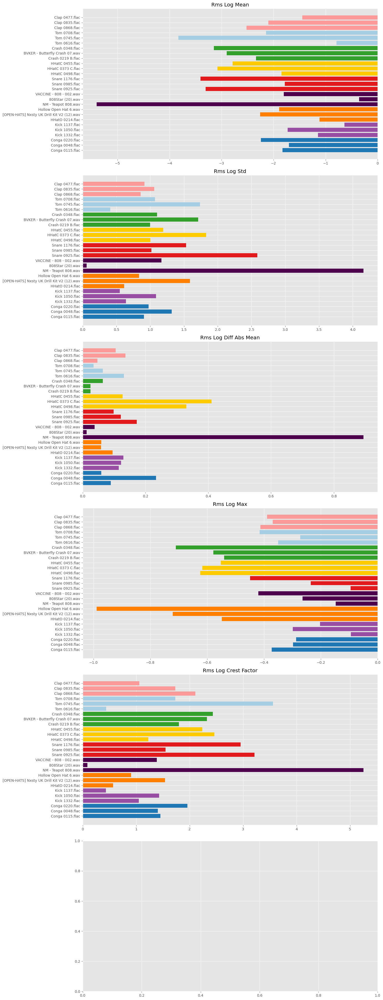

In [61]:

dicts = []
for file_path, (y, sr) in list(y_sr_examples.items()):
    stats, rms_log = get_rms_log_stats(y)
    stats['file_path'] = file_path
    dicts.append(stats)

df_examples = pd.DataFrame(dicts)
df_examples['class'] = df_examples['file_path'].apply(lambda x: class_examples[x])
# get file names
df_examples['file_name'] = df_examples['file_path'].apply(lambda x: os.path.basename(x))

# bar plot
fig, axs = plt.subplots(6, 1, figsize=(15, 6 * 6.5))

for i, rms_stat in enumerate(
        ['rms_log_mean', 'rms_log_std', 'rms_log_diff_abs_mean', 'rms_log_max', 'rms_log_crest_factor']):
    # set title
    axs[i].set_title(rms_stat.replace('_', ' ').title())
    for class_name in CLASS_COLORS.keys():
        df_class = df_examples[df_examples['class'] == class_name]
        axs[i].barh(df_class['file_name'], df_class[rms_stat], label=class_name, color=CLASS_COLORS[class_name])

    #axs[i].legend()

plt.tight_layout()
plt.show()

On remarque clairement que certaines classes se distinguent par leur RMS.

Par exemples les sons de percussion tels que les Hat Closed (Cymbal) et les Hat Open (Cymbal) ont généralement une

### Taux de changement de signe (Zero crossing rate)

![](../images/ZeroCrossinga.png)

Si vous zoomez sur le signal (waveform), vous verrez le signal osciller au-dessus et en dessous de zéro. Le taux de passage par zéro (ZCR) mesure le taux de changement de signe du son, donnant une indication de sa fréquence. Nous calculons le ZCR de la même manière que le RMS, c'est-à-dire en divisant le son en fenêtres et en calculant le ZCR pour chaque fenêtre. Les statistiques globales du ZCR nous donnent une image de la variabilité de la fréquence sur tout le son

La moyenne et l'écart-type du taux de passage par zéro peuvent être utilisés pour caractériser le caractère percussif d'un son. La trame la plus forte est la trame avec le taux de passage par zéro le plus élevé (loudest frame).


In [62]:
def get_zero_crossing_rate_stats(y, frame_length=ZCR_FRAME_LENGTH, hop_length=HOP_LENGTH) -> Dict[str, float]:
    zcr = librosa.feature.zero_crossing_rate(y=y, frame_length=ZCR_FRAME_LENGTH, hop_length=HOP_LENGTH)
    loudest_frame = np.argmax(zcr)
    return {
        "zcr_sum": np.sum(zcr),
        'zcr_mean': np.mean(zcr),
        'zcr_std': np.std(zcr),
        'zcr_loudest_frame': zcr[0, loudest_frame]
    }, zcr


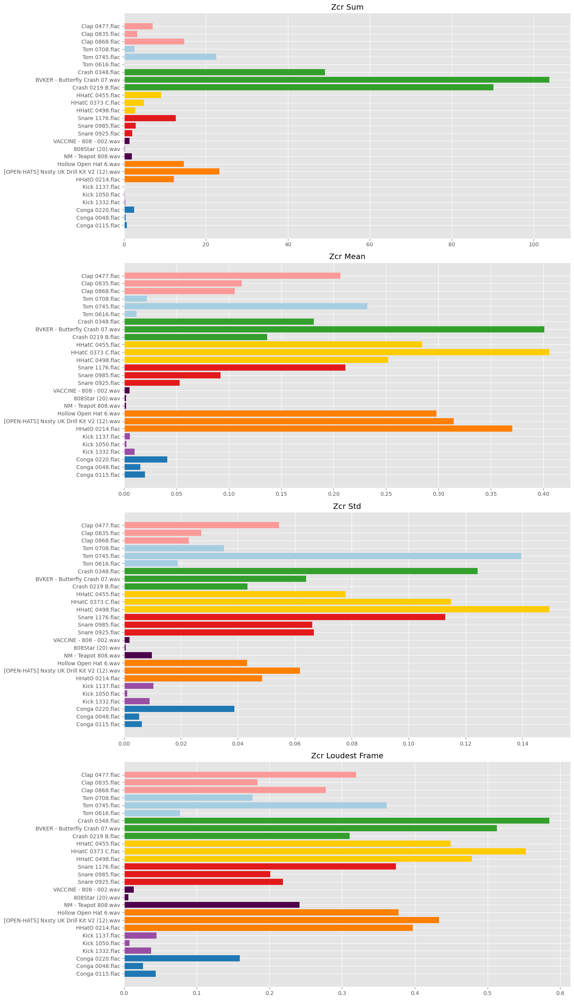

In [63]:
dicts = []
for file_path, (y, sr) in list(y_sr_examples.items()):
    stats, zcr = get_zero_crossing_rate_stats(y, frame_length=ZCR_FRAME_LENGTH, hop_length=HOP_LENGTH)
    stats['file_path'] = file_path
    dicts.append(stats)

df_examples = pd.DataFrame(dicts)
df_examples['class'] = df_examples['file_path'].apply(lambda x: class_examples[x])
# get file names
df_examples['file_name'] = df_examples['file_path'].apply(lambda x: os.path.basename(x))

# bar zcr_mean, zcr_std, zcr_loudest_frame
fig, axs = plt.subplots(4, 1, figsize=(15, 4 * 6.5))

for i, zcr_stat in enumerate(['zcr_sum', 'zcr_mean', 'zcr_std', 'zcr_loudest_frame']):
    # set title
    axs[i].set_title(zcr_stat.replace('_', ' ').title())
    for class_name in CLASS_COLORS.keys():
        df_class = df_examples[df_examples['class'] == class_name]
        axs[i].barh(df_class['file_name'], df_class[zcr_stat], label=class_name, color=CLASS_COLORS[class_name])

plt.tight_layout()
plt.show()

### Centroïde temporel (Temporal centroid)

Le centroïde temporel, également connu sous le nom de centroïde de l'enveloppe, est une mesure qui décrit la répartition de l'énergie d'un signal audio dans le temps. Il donne une idée du "centre de gravité" de l'enveloppe du signal et peut être utilisé pour caractériser le moment où l'énergie du signal est concentrée.

Le centroïde temporel peut être une caractéristique utile pour décrire un audio, car il fournit des informations sur la répartition temporelle de l'énergie du signal. Par exemple, il peut être utilisé pour distinguer entre des sons qui ont une attaque rapide et une décroissance lente (comme un coup de tambour) et des sons qui ont une montée progressive et une décroissance rapide (comme un son de corde pincée).

100%|██████████| 15/15 [00:18<00:00,  1.25s/it]


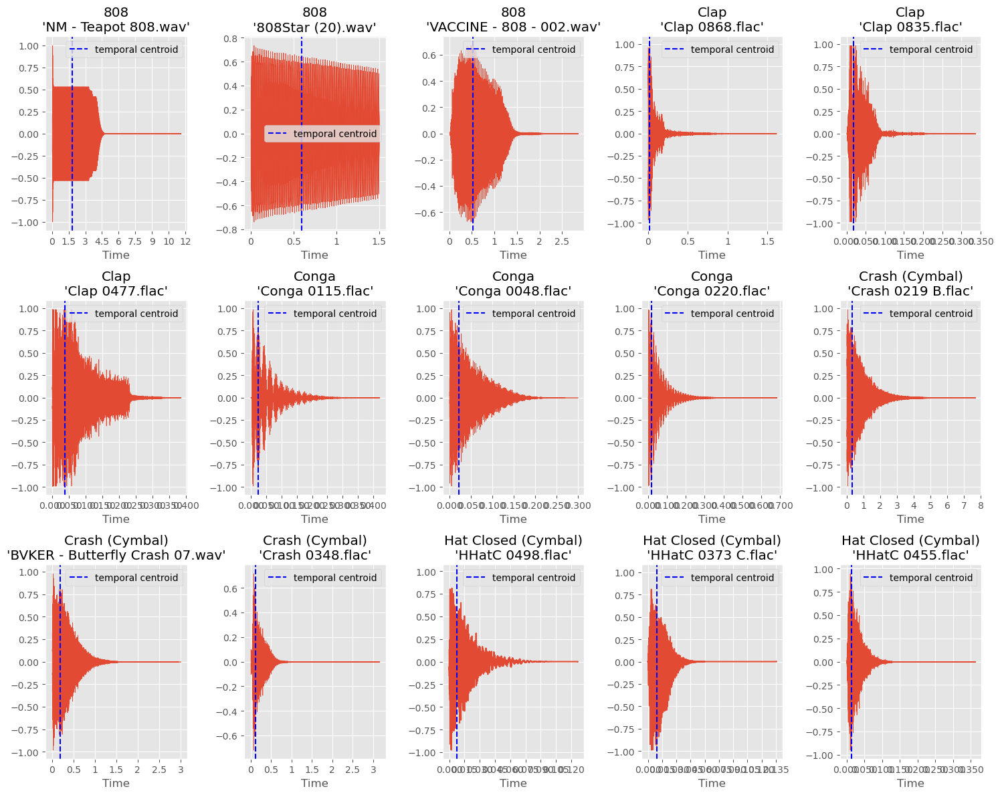

In [64]:
def get_temporal_centroid(y, sr) -> float:
    energy = np.sum(y ** 2)
    energy_cumulative = np.cumsum(y ** 2)
    half_energy_time = np.argmax(energy_cumulative >= 0.5 * energy)
    return half_energy_time / sr


max_examples = 15
n_plots = len(y_sr_examples) if max_examples is None else min(max_examples, len(y_sr_examples))
n_cols = 5
n_rows = int(np.ceil(n_plots / n_cols))
fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))
for idx, (file_path, (y, sr)) in tqdm(enumerate(list(y_sr_examples.items())[:max_examples]), total=n_plots):
    ax = axs[idx // n_cols, idx % n_cols]
    # plot the signal waveform and the temporal centroid
    librosa.display.waveshow(y, sr=sr, ax=ax)
    ax.axvline(get_temporal_centroid(y, sr), color='blue', linestyle='--', label='temporal centroid')

    title = f"{class_examples[file_path]}\n'{os.path.basename(file_path)}'"
    ax.set_title(title)
    ax.legend()

plt.tight_layout()
plt.show()

### ADSR (Attack, Decay, Sustain, Release)

L'enveloppe ADSR est une représentation graphique de la dynamique d'un son. Il est couramment utilisé pour décrire les caractéristiques temporelles d'un son, telles que le temps d'attaque, le temps de décroissance, le temps de soutien et le temps de relâchement.

- Le temps d'attaque (attack time)
- Le temps de décroissance (decay time)
- Le temps de soutien (sustain time)
- Le temps de relâchement (release time)

![adsr](../images/img_1.png)

#### Temps d'attaque (attack time)

Le temps d'attaque est généralement défini comme la durée nécessaire pour qu'un signal audio atteigne son amplitude maximale à partir du début.



In [65]:
def get_attack_time(y, sr):
    """
    Calcule le temps d'attaque logarithmique d'un signal audio.

    Args:
        y (np.ndarray): Signal audio.
        sr (int): Fréquence d'échantillonnage du signal audio.

    Returns:
        float: Temps d'attaque logarithmique en secondes.
    """
    # Calcul de l'enveloppe du signal
    envelope = np.abs(hilbert(y))
    # Recherche de l'indice du pic d'enveloppe
    peak_idx = np.argmax(envelope)
    # Calcul du temps d'attaque logarithmique
    attack_time = peak_idx / float(sr)

    return attack_time


def get_log_attack_time(y, sr):
    """
    Calcule le temps d'attaque logarithmique d'un signal audio.

    Args:
        y (np.ndarray): Signal audio.
        sr (int): Fréquence d'échantillonnage du signal audio.

    Returns:
        float: Temps d'attaque logarithmique en secondes.
    """
    attack_time = get_attack_time(y, sr)
    # Conversion du temps d'attaque en échelle logarithmique
    log_attack_time = np.log(attack_time) if attack_time > 0 else np.log(1e-5)
    """
      Retourner 0 :

      Avantage : Cette valeur est simple et facile à interpréter.
      Inconvénient : Si le temps d'attaque réel est très proche de 0, la différence entre les valeurs réelles et 0 peut être importante en termes de log. Cela pourrait affecter l'analyse ou l'apprentissage automatique ultérieur.

      Retourner np.log10(1e-5) :

      Avantage : Cette valeur préserve l'échelle logarithmique et évite de créer une différence artificielle importante entre les valeurs réelles et la valeur par défaut.
      Inconvénient : La valeur np.log10(1e-5) est moins intuitive et peut nécessiter une explication supplémentaire pour être interprétée correctement.
      """
    return log_attack_time

Le temps d'attaque est généralement exprimé en secondes, donc en utilisant le logarithme base 10, nous obtenons des valeurs négatives pour des temps d'attaque inférieurs à 1 seconde. Le logarithme base 10 d'un nombre entre 0 et 1 est négatif, car il représente combien de fois 10 doit être élevé à une puissance négative pour obtenir ce nombre.

Il est courant d'utiliser des valeurs de temps d'attaque logarithmiques pour représenter la dynamique de l'enveloppe d'un signal audio, car cela peut mieux refléter la perception humaine de la différence de niveau sonore entre les attaques rapides et lentes.

Travailler avec le logarithme du temps d'attaque peut être intéressant dans certaines situations, notamment lorsque vous voulez réduire la sensibilité aux variations extrêmes de temps d'attaque ou si vous voulez mieux distinguer les différences entre des temps d'attaque très courts.

Cependant, il est important de noter que l'utilisation du logarithme du temps d'attaque peut également rendre les différences entre des temps d'attaque plus longs moins importantes. Par conséquent, l'efficacité de cette transformation dépendra de l'importance relative des temps d'attaque courts et longs pour votre application spécifique.



#### Temps de relâchement (release time)

Le relâchement est généralement défini comme la durée nécessaire pour qu'un signal audio tombe en dessous d'un certain seuil à partir de son amplitude maximale. Ce seuil est généralement défini à 90% de l'amplitude maximale.

In [66]:
def get_release_time(y, sr, threshold=0.9):
    """
    Calcule le log du temps de relâchement d'un signal audio.

    Args:
        y (np.ndarray): Le signal audio.
        sr (int): Le taux d'échantillonnage du signal audio.
        threshold (float): Le seuil pour détecter le relâchement du signal audio.

    Returns:
        float: Le log du temps de relâchement.
    """
    # Calcul de l'enveloppe analytique
    y_analytic = hilbert(y)
    y_env = np.abs(y_analytic)

    if len(y_env) == 0:
        return 0, 0

    # Recherche des indices où l'enveloppe tombe en dessous du seuil
    below_threshold_indices = np.where(y_env < threshold * np.max(y_env))[0]

    # Calcul du temps de relâchement en secondes
    release_time = below_threshold_indices[0] / float(sr)

    return release_time


def get_log_release_time(y, sr, threshold=0.9):
    """
    Calcule le log du temps de relâchement d'un signal audio.

    Args:
        y (np.ndarray): Le signal audio.
        sr (int): Le taux d'échantillonnage du signal audio.
        threshold (float): Le seuil pour détecter le relâchement du signal audio.

    Returns:
        float: Le log du temps de relâchement.
    """
    release_time = get_release_time(y, sr, threshold)
    # Conversion du temps de relâchement en échelle logarithmique
    # Calcul du log du temps de relâchement, en évitant la division par zéro

    log_release_time = np.log(release_time) if release_time > 0 else np.log(1e-5)

    # log_release_time = np.log10(release_time)

    return log_release_time

#### Probléme lors d'implémentation...

Malheuresement, je n'ai pas reussi à implémenter les fonctions pour extraire le sustain et le decay.
J'ai essayé de suivre la même logique que pour l'attack mais je n'ai pas réussi à obtenir des résultats satisfaisants. J'ai donc décidé de ne pas les inclure dans le notebook. De plus l'extraction du release n'est pas très juste.

#### Visualisation des temps d'attaque et de relâchement sur des exemples audio 📊


100%|██████████| 18/18 [00:24<00:00,  1.37s/it]


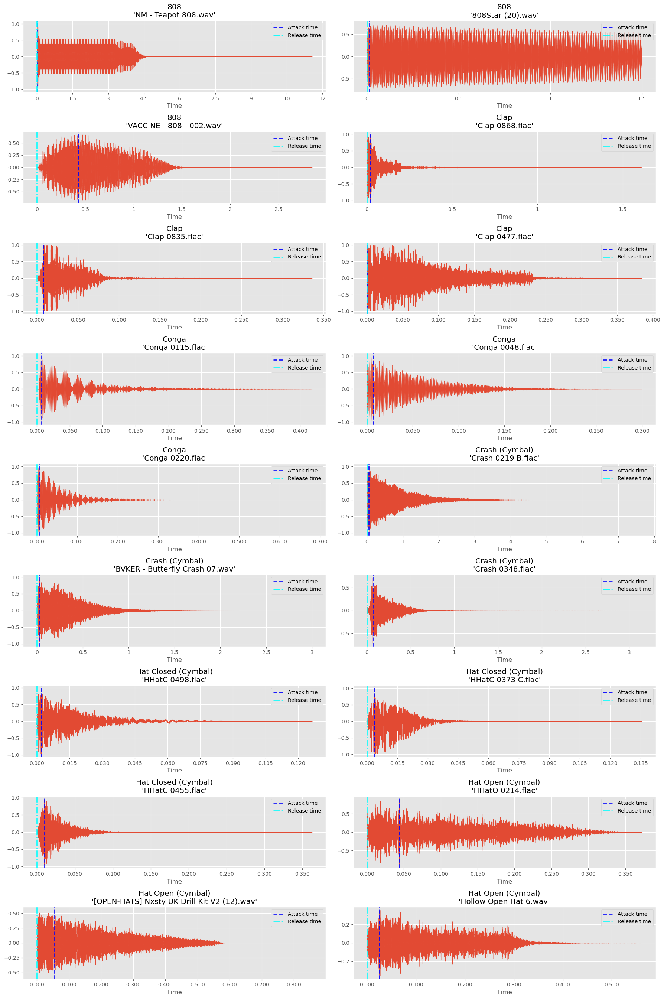

In [67]:
max_examples = 18
n_plots = len(y_sr_examples) if max_examples is None else min(max_examples, len(y_sr_examples))
n_cols = 2
n_rows = int(np.ceil(n_plots / n_cols))
fig, axs = plt.subplots(n_rows, n_cols, figsize=(18, 3 * n_rows))
for idx, (file_path, (y, sr)) in tqdm(enumerate(list(y_sr_examples.items())[:max_examples]), total=n_plots):
    ax = axs[idx // n_cols, idx % n_cols]
    # Affichage du signal audio
    librosa.display.waveshow(y, sr=sr, ax=ax)

    # Calcul du temps d'attaque
    attack_time = get_attack_time(y, sr)
    # Calcul du temps de relâchement
    release_time = get_release_time(y, sr)

    # Affichage
    ax.axvline(attack_time, color='blue', label='Attack time', alpha=0.9, linewidth=2, linestyle='--')
    ax.axvline(release_time, color='cyan', label='Release time', alpha=0.9, linewidth=2, linestyle='dashdot')

    # Configuration des axes et du titre

    title = f"{class_examples[file_path]}\n'{os.path.basename(file_path)}'"
    ax.set_title(title)
    ax.legend(loc='upper right')

plt.tight_layout()
plt.show()

## Caractéristiques dans le domaine fréquentiel

Les caractéristiques dans le domaine fréquentiel (Frequency-domain Features) sont généralement calculées à partir de la transformée de Fourier à court terme (STFT) d'un signal audio.

### Transformée de Fourier à court terme (STFT)

$$ STFT(t, f) = \int_{-\infty}^{\infty} x(\tau) w(\tau - t) e^{-j 2 \pi f \tau} d\tau $$
où $x$ est le signal audio, $w$ est la fenêtre de Hann, $t$ est le temps, $f$ est la fréquence et $\tau$ est le temps de la fenêtre.

La transformée de Fourier à court terme (STFT) est une version temporelle de la transformée de Fourier.
La STFT est calculée en découpant le signal audio en segments de temps et en calculant la transformée de Fourier de chaque segment. Cela permet d'obtenir une représentation fréquentielle du signal audio qui varie dans le temps. La STFT est calculée en utilisant une fenêtre de Hann de 2048 échantillons avec un décalage de 512 échantillons entre les segments de temps. La STFT est calculée en utilisant la fonction stft de librosa.



### Pitch (Hauteur)

La hauteur d'un son (pitch) correspond à la fréquence fondamentale d'un son. Il est directement lié à la notion de hauteur tonale (le ton) : un son aigu a un pitch élevé, tandis qu'un son grave a un pitch bas. Plus simplement, c'est la note musicale qu'on pourrait assigner à un son. Pour faire une analogie, sur un piano, si vous appuyez sur une touche à l'extrême droite du clavier, vous obtenez un son aigu (pitch élevé), tandis que si vous appuyez sur une touche à l'extrême gauche, vous obtenez un son grave (pitch bas).

![](../images/img_31.png)

Pour estimer le pitch d'un signal audio, nous utilisons la méthode de McLeod. Cette méthode est

In [68]:
def get_pitch(y, sr, fmin=20.0, fmax=2000):
    """
    Estime le pitch d'un signal audio en utilisant la méthode de l'autocorrélation.

    Args:
        y (np.ndarray): Le signal audio.
        sr (int): La fréquence d'échantillonnage.
        fmin (int, optional): La fréquence minimale pour estimer le pitch. Defaults to 50.
        fmax (int, optional): La fréquence maximale pour estimer le pitch. Defaults to 2000.

    Returns:
        float: Le pitch estimé en Hz.
    """
    # Calculer la fonction d'autocorrélation à court terme
    # l'auto-corrélation est calculée sur une fenêtre de 3 secondes
    autocorr = librosa.autocorrelate(y, max_size=3 * sr)

    # Trouver les limites de la région d'intérêt dans l'autocorrélation
    i_min = int(sr // fmax)
    i_max = int(sr // fmin)

    # Trouver l'index du maximum local dans la région d'intérêt
    i_peak = np.argmax(autocorr[i_min:i_max]) + i_min

    # Convertir l'index en fréquence
    f0 = float(sr) / i_peak

    return f0


def pitch_to_midi(pitch):
    """
    Convertit le pitch en Hz en midi.

    Args:
        pitch (float): Le pitch en Hz.

    Returns:
        float: Le pitch en midi.
    """
    return 69 + 12 * np.log2(pitch / 440.0)


def midi_to_note_name(midi: float):
    """
    Convertit le pitch en midi en nom de note.

    Args:
        midi (float): Le pitch en midi.

    Returns:
        str: Le nom de la note.
    """
    notes = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
    return notes[int(midi) % 12] + str(int(midi) // 12 - 1)


dicts = [(file_path, os.path.basename(file_path), get_pitch(y=y, sr=sr), class_examples[file_path]) for
         file_path, (y, sr) in list(y_sr_examples.items())]
df_examples = pd.DataFrame(dicts, columns=['file_path', 'file_name', 'pitch', 'class']).set_index('file_path')
df_examples['pitch_midi'] = df_examples['pitch'].apply(pitch_to_midi)
df_examples['note_name'] = df_examples['pitch_midi'].apply(midi_to_note_name)

df_examples

,file_name,pitch,class,pitch_midi,note_name
file_path,,,,,
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\808\NM - Teapot 808.wav,NM - Teapot 808.wav,2004.545455,808,95.252396,B6
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\808\808Star (20).wav,808Star (20).wav,2004.545455,808,95.252396,B6
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\808\VACCINE - 808 - 002.wav,VACCINE - 808 - 002.wav,35.167464,808,25.257716,C#1
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Clap\Clap 0868.flac,Clap 0868.flac,1102.500000,Clap,84.902439,C6
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Clap\Clap 0835.flac,Clap 0835.flac,1575.000000,Clap,91.077317,G6
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Clap\Clap 0477.flac,Clap 0477.flac,91.304348,Clap,41.775023,F2
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Conga\Conga 0115.flac,Conga 0115.flac,312.765957,Conga,63.090960,D#4
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Conga\Conga 0048.flac,Conga 0048.flac,331.578947,Conga,64.102187,E4
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Conga\Conga 0220.flac,Conga 0220.flac,364.462810,Conga,65.739217,F4


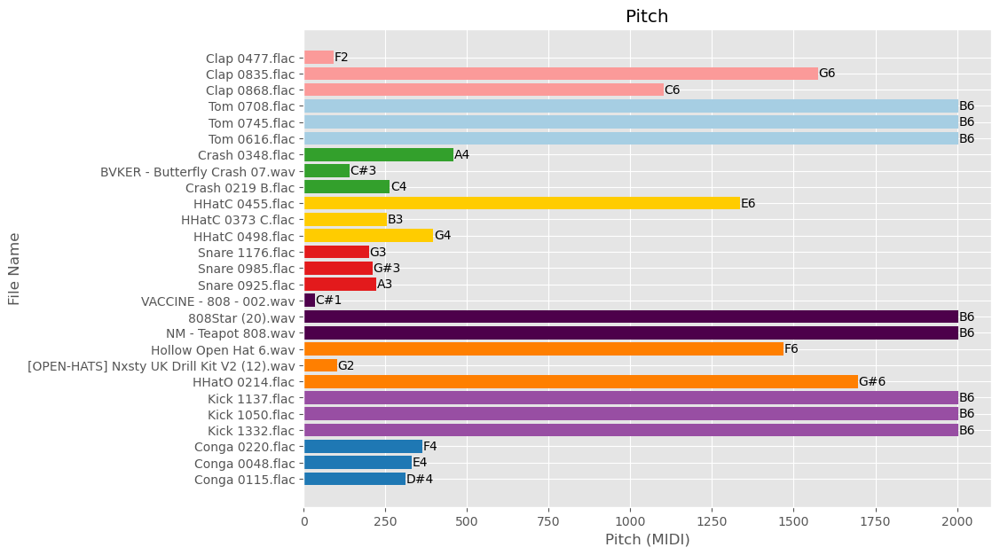

In [69]:
# bar plot
fig, ax = plt.subplots(1, 1, figsize=(10, 7))
# set title
plt.title("Pitch")
for class_name in CLASS_COLORS.keys():
    df_class = df_examples[df_examples['class'] == class_name]
    bars = plt.barh(df_class['file_name'], df_class["pitch"], label=class_name, color=CLASS_COLORS[class_name])
    # Ajouter les valeurs de pitch en MIDI à côté de chaque barre
    for i, bar in enumerate(bars):
        ax.text(bar.get_width() + 1, bar.get_y() + bar.get_height() / 2, f'{df_class["note_name"].iloc[i]}',
                va='center')

plt.xlabel('Pitch (MIDI)')
plt.ylabel('File Name')
plt.show()

### MFCC

Les Coefficients Cepstraux de Fréquences de Mel, ou MFCC, sont une caractéristique très utilisée en reconnaissance vocale et en traitement du son en général. Ces coefficients décrivent la forme du spectre de puissance (l'énergie à différentes fréquences) d'un son, mais d'une manière spéciale : ils imitent la façon dont l'oreille humaine perçoit les sons. En particulier, ils donnent plus de poids aux fréquences que nous sommes plus capables de distinguer et moins de poids à celles que nous ne discernons pas bien. Les MFCC sont souvent visualisés sous forme de spectrogramme, où l'axe vertical représente les différentes bandes de fréquences Mel et l'axe horizontal représente le temps. L'intensité de chaque point (fréquence, temps) est alors représentée par la couleur.

---

Les MFCC sont utiles pour la classification des drums pour plusieurs raisons :

- Invariance aux changements d'amplitude : Les MFCC sont relativement insensibles aux changements d'amplitude du signal, ce qui est important pour la classification des drums, car les enregistrements peuvent varier en volume.

- Capture des caractéristiques du timbre : Les MFCC sont capables de capturer les caractéristiques du timbre, qui sont essentielles pour différencier les différents types de drums, tels que les caisses claires, les cymbales et les toms.

- Robustesse au bruit : Les MFCC sont également assez robustes face au bruit, ce qui peut être bénéfique pour la classification des drums, car les enregistrements peuvent contenir divers types de bruit de fond.

- Compressibilité : Les MFCC offrent une représentation compacte des caractéristiques spectrales du signal audio, ce qui peut faciliter la mise en œuvre et l'entraînement des modèles de classification.


En ce qui concerne le nombre optimal de MFCC à utiliser pour la classification de sons de batterie, il n'y a pas de valeur unique qui soit "parfaite" pour tous les cas. Le nombre de MFCC à utiliser dépend des caractéristiques spécifiques des sons que l'on souhaite classifier et de la performance de votre modèle de classification. En général, on utilise un nombre limité de MFCC (par exemple, les 12 ou 13 premiers) pour représenter un signal audio, car les MFCC supérieurs sont souvent moins pertinents pour la perception humaine et peuvent introduire du bruit.


Pour la classification de sons de notre projet, on utilisera alors 12 MFCC (par défaut).

Remarque que l'utilisation d'un plus grand nombre de MFCC peut augmenter la complexité du modèle et le temps de calcul, et pourrait potentiellement causer un surapprentissage si la taille de l'ensemble de données est limitée. Par conséquent, il est important de trouver un bon équilibre entre la représentativité des caractéristiques et la complexité du modèle.


100%|██████████| 27/27 [00:00<00:00, 93.84it/s]


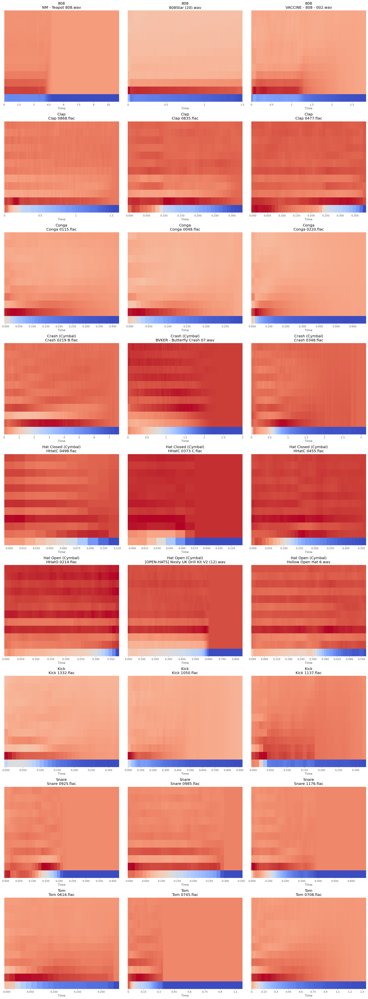

In [70]:
max_examples = 30
n_plots = len(y_sr_examples) if max_examples is None else min(max_examples, len(y_sr_examples))
n_cols = 3
n_rows = int(np.ceil(n_plots / n_cols))
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 6 * n_rows))
for idx, (file_path, (y, sr)) in tqdm(enumerate(list(y_sr_examples.items())[:max_examples]), total=n_plots):
    ax = axs[idx // n_cols, idx % n_cols]

    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=N_MFCC, n_fft=N_FFT, hop_length=HOP_LENGTH)

    librosa.display.specshow(mfccs, sr=sr, hop_length=HOP_LENGTH, x_axis='time', ax=ax)

    class_name = class_examples[file_path]
    ax.set(title=f"{class_name}\n{os.path.basename(file_path)}")
    #ax.label_outer()

plt.tight_layout()
plt.show()


> **Résumé des statistiques des MFCC choisies et extraits**

- **mfcc_mean**: Les moyennes des MFCC sont souvent utilisées comme caractéristiques pour la classification audio, car elles fournissent une représentation compacte de la distribution globale des fréquences dans le signal.

- **mfcc_std**: Les écarts-types des MFCC peuvent également être utiles, car ils représentent la variabilité des fréquences dans le signal. Des signaux audio différents pourraient avoir des moyennes de MFCC similaires, mais des écarts-types très différents, ce qui peut être utile pour les distinguer.

- **mfcc_max** et **mfcc_min**: Les valeurs maximales et minimales des MFCC peuvent être moins informatives que les moyennes et les écarts-types, mais elles peuvent encore aider à capturer les extrêmes dans la distribution des fréquences.

- **mfcc_skew** et **mfcc_kurtosis**: Ces caractéristiques mesurent l'asymétrie et la "pointe" de la distribution des MFCC, respectivement.  L'asymétrie est une mesure de la symétrie de la distribution des fréquences, cette caractéristique peut être utile pour capturer les différences entre les signaux audio qui ont des distributions de fréquences similaires mais qui sont légèrement décalées. La kurtosis est une mesure qui décrit la forme d'une distribution, en mettant l'accent sur la concentration des valeurs autour de la moyenne. Dans le contexte de la classification audio, une kurtosis élevée des MFCC pourrait indiquer que le signal audio est plus concentré autour de certaines fréquences, tandis qu'une kurtosis faible pourrait indiquer une distribution plus uniforme des fréquences. Elles peuvent être utiles pour capturer des aspects plus subtils de la distribution des fréquences. On va les essayer et voir si elles améliorent les performances de votre modèle, mais elles pourraient ne pas être essentielles.


In [71]:
# transform a Dict[str, np.ndarray] into a Dict[str, float]
def flatten_dict(d: Dict[str, np.ndarray], start: int = 0) -> Dict[str, float]:
    # exemple {"mfcc_mean" : np.ndarray } -> [mfcc_mean_0, mfcc_mean_1, ...]
    result = {}
    for k, tab in d.items():
        for i, v in enumerate(tab, start=start):
            result[f'{k}_{i}'] = v
    return result


flatten_dict({'a': np.array([1, 2, 3]), 'b': np.array([4, 5, 6])})

{'a_0': 1, 'a_1': 2, 'a_2': 3, 'b_0': 4, 'b_1': 5, 'b_2': 6}

100%|██████████| 6/6 [00:06<00:00,  1.01s/it]


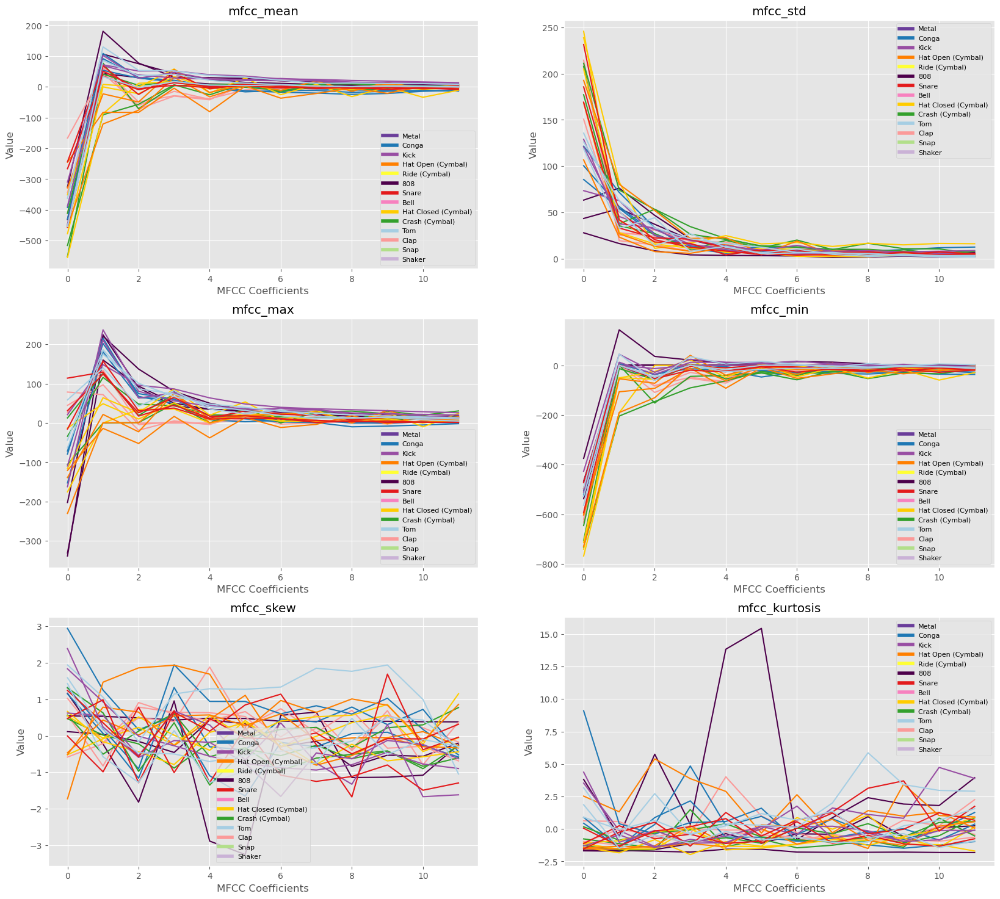

In [72]:
def get_mfcc_stats(y, sr, n_mfcc: int = N_MFCC, n_fft: int = N_FFT, hop_length: int = HOP_LENGTH) -> Dict[
    str, np.ndarray]:
    """
    Calcule les statistiques du MFCC d'un signal audio.

    Args:
        y (np.ndarray): Le signal audio.
        sr (int): La fréquence d'échantillonnage.
        n_mfcc (int, optional): Le nombre de MFCC. Defaults to 20. Un nombre plus élevé de MFCC peut fournir une représentation plus détaillée du signal audio, mais peut également augmenter le temps de calcul et la complexité du modèle de classification.
        n_fft (int, optional): La taille de la fenêtre pour la STFT. Defaults to 2048.
        hop_length (int, optional): Le pas de la fenêtre. Defaults to 512.

    Returns:
        dict: Les statistiques du MFCC.
    """
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, n_fft=n_fft, hop_length=hop_length)

    mfcc_stats = {
        'mfcc_mean': mfcc.mean(axis=1),
        'mfcc_std': mfcc.std(axis=1),
        'mfcc_max': mfcc.max(axis=1),
        'mfcc_min': mfcc.min(axis=1),
        'mfcc_skew': scipy.stats.skew(mfcc, axis=1),
        'mfcc_kurtosis': scipy.stats.kurtosis(mfcc, axis=1),
    }
    return mfcc_stats


mfcc_stats_names = ['mfcc_mean', 'mfcc_std', 'mfcc_max', 'mfcc_min', 'mfcc_skew', 'mfcc_kurtosis']

# plot for each stats_name
fig, axs = plt.subplots(len(mfcc_stats_names) // 2, 2, figsize=(20, (len(mfcc_stats_names) // 2) * 6))

for idx_mfcc_stats_names, stats_name in tqdm(enumerate(mfcc_stats_names), total=len(mfcc_stats_names)):
    for _, (file_path, (y, sr)) in enumerate(list(y_sr_examples.items())[:]):
        file_name = os.path.basename(file_path)
        mfcc_stats = get_mfcc_stats(y, sr)

        # axs coordinates
        i, j = idx_mfcc_stats_names // 2, idx_mfcc_stats_names % 2
        axs[i, j].set_title(stats_name)
        axs[i, j].set_xlabel('MFCC Coefficients')
        axs[i, j].set_ylabel('Value')
        class_name = class_examples[file_path]
        axs[i, j].plot(mfcc_stats[stats_name], label=f"{file_name}", color=CLASS_COLORS[class_name])
        #axs[i, j].legend()
        # legend color
        # create legend element with CLASS_COLORS
        legend_elements = [Line2D([0], [0], color=CLASS_COLORS[class_name], lw=4, label=class_name) for class_name in
                           CLASS_COLORS]

        # small size for legend
        axs[i, j].legend(handles=legend_elements, prop={'size': 8})

plt.show()

### Caractéristiques spectrales (Spectral Features)

Les caractéristiques spectrales sont des mesures statistiques dérivées du spectre de fréquence d'un signal audio.

On s'est intéressé aux caractéristiques spectrales suivantes :
- Centroid spectral
- Largeur de bande spectrale
- Platitude spectrale
- Roll-off spectral
- Contraste spectral

#### Centroïde spectral (Spectral Centroid)

Le centroïde spectral est une mesure qui décrit la répartition de l'énergie d'un signal audio dans le domaine fréquentiel. Il donne une idée du "centre de gravité" du spectre du signal et peut être utilisé pour caractériser la "couleur" ou la "brillance" du son.

Le centroïde spectral peut être une caractéristique utile pour décrire un audio, car il fournit des informations sur la répartition fréquentielle de l'énergie du signal. Par exemple, il peut être utilisé pour distinguer entre des sons graves et des sons aigus, ou entre des sons "doux" et des sons "brillants".

Nous calculons le centroïde spectral  de la même manière que le RMS, c'est-à-dire en divisant le son en fenêtres et en calculant le le centroïde spectral pour chaque fenêtre.

---

- **spec_cent_mean**: moyenne des centroïdes spectraux de chaque fenêtre.
- **spec_cent_std**: écart-type du centroïde spectral : Il peut être utilisé pour capturer des aspects tels que la régularité ou l'irrégularité des fréquences dans le signal.

In [73]:
def get_spectral_centroid(y, sr, n_fft=N_FFT) -> Tuple[Dict[str, float], np.ndarray]:
    """Compute the spectral centroid of the signal y

    Args:
        y (np.ndarray): audio signal
        sr (int): sampling rate
        n_fft (int, optional): FFT window size. Defaults to N_FFT.

    Returns:
        Tuple[Dict[str, float], np.ndarray]: a tuple containing a dictionary with the mean and std of the spectral centroid and the spectral centroid
    """
    spec_cent = librosa.feature.spectral_centroid(y=y, sr=sr, n_fft=n_fft)
    return {"spec_cent_mean": np.mean(spec_cent), "spec_cent_std": np.std(spec_cent)}, spec_cent


#### Largeur de bande spectrale (Spectral Bandwidth)

Le "spectral bandwidth" (ou largeur de bande spectrale) est une mesure qui décrit la répartition des fréquences dans un signal audio. Plus précisément, il s'agit de la largeur de la distribution spectrale qui contient une certaine quantité d'énergie, généralement définie comme 50% de la puissance spectrale totale (ce qui correspond à la largeur de bande spectrale à -3 dB).

Le spectral bandwidth peut être utile pour décrire un audio, car il fournit des informations sur la répartition des fréquences et la complexité spectrale du signal. Par exemple, un signal audio avec une bande passante spectrale étroite aura une tonalité plus pure (comme une note de flûte), tandis qu'un signal avec une large bande passante spectrale aura un spectre de fréquences plus large et un son plus complexe (comme le bruit d'un tambour).


In [74]:
def get_spectral_bandwidth(y, sr, n_fft=N_FFT):
    """Compute the spectral bandwidth of the signal y

    Args:
        y (np.ndarray): audio signal
        sr (int): sampling rate
        n_fft (int, optional): FFT window size. Defaults to N_FFT.

    Returns:
        Tuple[Dict[str, float], np.ndarray]: a tuple containing a dictionary with the mean and std of the spectral bandwidth and the spectral bandwidth
    """
    spec_bw = librosa.feature.spectral_bandwidth(y=y, sr=sr, n_fft=n_fft)
    return {"spec_bw_mean": np.mean(spec_bw), "spec_bw_std": np.std(spec_bw)}, spec_bw


#### Platitude spectrale (Spectral Flatness)

La platitude spectrale (Spectral Flatness), également connu sous le nom de Wiener Entropy, est une mesure de la "platitude" d'un spectre. Il est utilisé pour caractériser le son en termes de répartition de l'énergie dans le spectre. La platitude spectrale est définie comme le rapport de la moyenne géométrique des amplitudes spectrales à la moyenne arithmétique des amplitudes spectrales.

Simplement dit, la platitude spectral est une mesure de la "complexité" du spectre.

Cette valeur est compris entre 0 et 1 :

- Une valeur proche de 1 indique un spectre plat, c'est-à-dire que les amplitudes des fréquences sont réparties de manière égale dans tout le spectre. Un exemple de son avec une platitude spectrale élevée est le bruit blanc, où toutes les fréquences ont la même amplitude.
- Une valeur proche de 0 indique un spectre avec des pics prononcés, c'est-à-dire que certaines fréquences ont des amplitudes beaucoup plus élevées que d'autres. Les sons tonals, comme les notes de musique, ont généralement une faible platitude spectrale.
Le Spectral Flatness peut être une bonne caractéristique pour décrire un audio, en particulier lorsqu'il est utilisé en combinaison avec d'autres caractéristiques spectrales telles que le centroïde spectral, la largeur de bande spectrale et le déclin spectral. Il peut aider à différencier les sons tonals des sons bruités et à caractériser la répartition des fréquences dans un signal audio.

In [75]:
def get_spectral_flatness(y, sr, n_fft=N_FFT) -> Tuple[Dict[str, float], np.ndarray]:
    """Compute the spectral flatness of the signal y

    Args:
        y (np.ndarray): audio signal
        sr (int): sampling rate
        n_fft (int, optional): FFT window size. Defaults to N_FFT.

    Returns:
        Tuple[Dict[str, float], np.ndarray]: a tuple containing a dictionary with the mean and std of the spectral flatness and the spectral flatness
    """
    spec_flatness = librosa.feature.spectral_flatness(y=y, n_fft=n_fft)
    return {"spec_flatness_mean": np.mean(spec_flatness), "spec_flatness_std": np.std(spec_flatness)}, spec_flatness

#### Roll-off spectral (Spectral Rolloff)

Le Spectral Rolloff est une mesure qui indique la fréquence en dessous de laquelle se trouve une certaine fraction (généralement 85% ou 95%) de l'énergie spectrale totale d'un signal audio. C'est une caractéristique souvent utilisée pour décrire le contenu fréquentiel d'un signal et peut être utile dans la classification audio.

Pour notre projet, nous prendrons en compte le Spectral Rolloff à 85% et à 15% de l'énergie spectrale totale.

---

_**Pourquoi ces choix de % ?**_

- `roll_percent=0.85`: Le Spectral Rolloff est calculé en trouvant la fréquence en dessous de laquelle 85% de l'énergie spectrale totale est concentrée. Cela donne une idée de la répartition des fréquences plus élevées dans le signal.
- `roll_percent=0.15`: Le Spectral Rolloff est calculé en trouvant la fréquence en dessous de laquelle 15% de l'énergie spectrale totale est concentrée. Cela donne une idée de la répartition des fréquences plus basses dans le signal.

Notre un ensemble de données audio contient des instruments avec des contenus fréquentiels très différents ainsi... Le Roll-off spectral pourrait être une caractéristique utile pour distinguer ces sons en se basant sur leur distribution d'énergie spectrale.

In [76]:
def get_spectral_rolloff(y, sr, roll_percent=0.85, n_fft=N_FFT) -> Tuple[Dict[str, float], np.ndarray]:
    """Compute the spectral rolloff of the signal y

    Args:
        y (np.ndarray): audio signal
        sr (int): sampling rate
        roll_percent (float, optional): percentage of the total energy. Defaults to 0.85.
        n_fft (int, optional): FFT window size. Defaults to N_FFT.

    Returns:
        Tuple[Dict[str, float], np.ndarray]: a tuple containing a dictionary with the mean and std of the spectral rolloff and the spectral rolloff
    """
    percent_str = str(roll_percent).split(".")[-1]
    spec_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr, roll_percent=roll_percent, n_fft=n_fft)
    return {f"spec_rolloff_{percent_str}_mean": np.mean(spec_rolloff),
            f"spec_rolloff_{percent_str}_std": np.std(spec_rolloff)}, spec_rolloff

#rolloff_15 = spectral_rolloff(y1, sr1, roll_percent=0.15)
#rolloff_85 = spectral_rolloff(y1, sr1, roll_percent=0.85)

#### Contraste spectral (Spectral Contrast)

Le Contraste spectral est une caractéristique quantitative du spectre d'un signal audio qui capture la différence d'énergie entre les pics (zones de forte énergie) et les vallées (zones de faible énergie). Cela est réalisé en divisant le spectre en bandes de fréquences et en calculant la différence d'énergie entre les pics et les vallées dans chaque bande, ce qui offre une vue locale de la distribution de l'énergie dans le spectre.

Cette caractéristique peut être particulièrement utile pour distinguer différents types de sons de percussions. Chaque type de son de percussion a des signatures spectrales distinctes (pics et vallées) qui peuvent être soulignées par le contraste spectral.

Prenons par exemple les sons d'une cymbale, d'un tambour et d'une caisse claire. Une cymbale a tendance à avoir un contraste spectral élevé dans les fréquences aiguës à cause des vibrations complexes et métalliques qu'elle produit. Un tambour, quant à lui, peut présenter un contraste spectral élevé dans les fréquences basses en raison de la résonance profonde de sa membrane. Enfin, une caisse claire, avec son mélange distinctif de fréquences basses et hautes dû à la combinaison de la frappe sur la peau et le grésillement des cordes, présente un contraste spectral unique qui varie en fonction de l'intensité et du style de la frappe.

Ou encore, une guitare acoustique peut avoir un contraste spectral élevé dans les fréquences moyennes dû à ses harmoniques riches, tandis qu'une guitare électrique peut avoir un contraste élevé dans les fréquences aiguës en raison de l'amplification et des effets électroniques. Le piano, avec sa variété de cordes et sa large gamme de fréquences, présente un contraste spectral unique qui varie en fonction de la tessiture et du timbre du son produit.

In [77]:
def get_spectral_contrast(y, sr, n_fft=N_FFT) -> Tuple[Dict[str, float], np.ndarray]:
    """Compute the spectral contrast of the signal y

    Args:
        y (np.ndarray): audio signal
        sr (int): sampling rate
        n_fft (int, optional): FFT window size. Defaults to N_FFT.

    Returns:
        Tuple[Dict[str, float], np.ndarray]: a tuple containing a dictionary with the mean and std of the spectral contrast and the spectral contrast
    """
    spec_contrast = librosa.feature.spectral_contrast(y=y, sr=sr, n_fft=n_fft)
    return {"spec_contrast_mean": np.mean(spec_contrast), "spec_contrast_std": np.std(spec_contrast)}, spec_contrast

#### Visualisation des caractéristiques spectrales avec quelques exemples

100%|██████████| 27/27 [00:01<00:00, 14.76it/s]


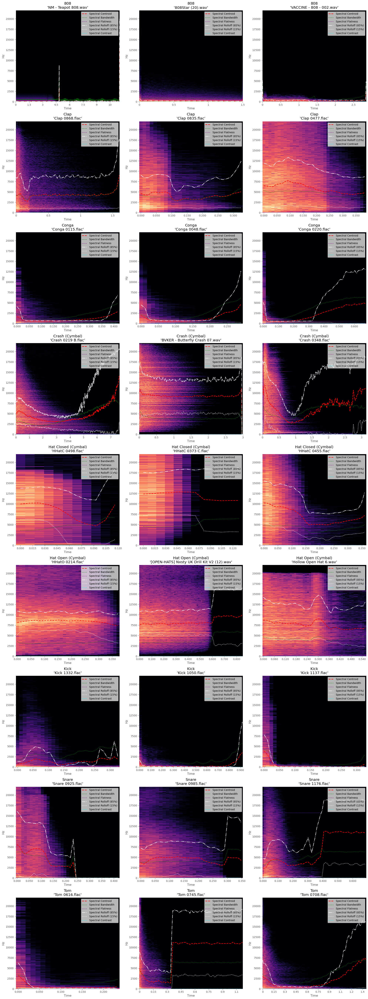

In [79]:
max_examples = 30
n_plots = len(y_sr_examples) if max_examples is None else min(max_examples, len(y_sr_examples))
n_cols = 3
n_rows = int(np.ceil(n_plots / n_cols))
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 6 * n_rows))
for idx, (file_path, (y, sr)) in tqdm(enumerate(list(y_sr_examples.items())[:max_examples]), total=n_plots):
    ax = axs[idx // n_cols, idx % n_cols]
    # Calcul du spectrogramme
    D = librosa.stft(y, n_fft=N_FFT, hop_length=HOP_LENGTH)
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

    # Calcul du centroïde spectral
    spec_cent_stats, spec_cent = get_spectral_centroid(y, sr)

    # Calcul de la largeur de bande spectrale
    spec_bw_stats, spec_bw = get_spectral_bandwidth(y, sr)

    # Calcul de la flatness spectrale
    spec_flatness_stats, spec_flatness = get_spectral_flatness(y, sr)

    # Calcul du spectral rolloff 85
    spec_rolloff_85_stats, spec_rolloff_85 = get_spectral_rolloff(y, sr, roll_percent=0.85)

    # Calcul du spectral rolloff 15
    spec_rolloff_15_stats, spec_rolloff_15 = get_spectral_rolloff(y, sr, roll_percent=0.15)

    # Calcul du spectral contrast
    spec_contrast_stats, spec_contrast = get_spectral_contrast(y, sr)

    # Conversion des frames en temps
    frames = range(len(spec_cent[0]))
    t = librosa.frames_to_time(frames, sr=sr, hop_length=N_FFT // 4)

    # Affichage du spectrogramme
    img = librosa.display.specshow(S_db, x_axis='time', y_axis='hz', sr=sr, hop_length=HOP_LENGTH, ax=ax)
    #fig.colorbar(img, ax=ax, format="%+2.f dB")

    # Affichage

    ax.plot(t, spec_cent[0], color='red', linewidth=2, alpha=0.95, label='Spectral Centroid', linestyle='--')
    ax.plot(t, spec_bw[0], color='green', linewidth=2, alpha=0.8, label='Spectral Bandwidth', linestyle=':')
    ax.plot(t, spec_flatness[0], color='purple', linewidth=2, alpha=0.8, label='Spectral Flatness', linestyle=':')
    ax.plot(t, spec_rolloff_85[0], color='white', linewidth=2, alpha=0.8, label='Spectral Rolloff (85%)',
            linestyle='dashdot', )
    ax.plot(t, spec_rolloff_15[0], color='white', linewidth=2, alpha=0.8, label='Spectral Rolloff (15%)', linestyle=':')
    ax.plot(t, spec_contrast[0], color='cyan', linewidth=2, alpha=0.8, label='Spectral Contrast', linestyle=':')

    # Configuration des axes et du titre

    ax.legend(loc='upper right')
    title = f"{class_examples[file_path]}\n'{os.path.basename(file_path)}'"
    ax.set_title(title)

plt.tight_layout()
plt.show()

100%|██████████| 27/27 [00:01<00:00, 14.32it/s]


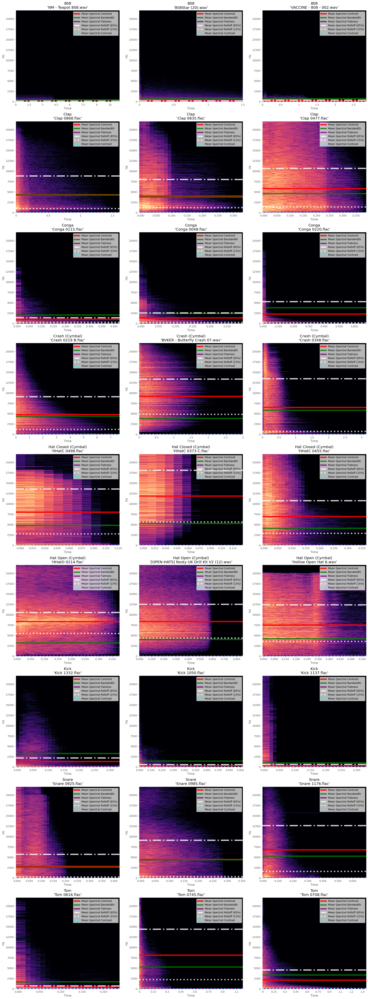

In [81]:
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 6 * n_rows))
for idx, (file_path, (y, sr)) in tqdm(enumerate(list(y_sr_examples.items())[:max_examples]), total=n_plots):
    ax = axs[idx // n_cols, idx % n_cols]
    # Calcul du spectrogramme
    D = librosa.stft(y, n_fft=N_FFT, hop_length=HOP_LENGTH)
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

    # Calcul du centroïde spectral
    spec_cent_stats, spec_cent = get_spectral_centroid(y, sr)
    mean_spec_cent = spec_cent_stats["spec_cent_mean"]

    # Calcul de la largeur de bande spectrale
    spec_bw_stats, spec_bw = get_spectral_bandwidth(y, sr)
    mean_spec_bw = spec_bw_stats["spec_bw_mean"]

    # Calcul de la flatness spectrale
    spec_flatness_stats, spec_flatness = get_spectral_flatness(y, sr)
    mean_spec_flatness = spec_flatness_stats["spec_flatness_mean"]

    # Calcul du spectral rolloff 85
    spec_rolloff_85_stats, spec_rolloff_85 = get_spectral_rolloff(y, sr, roll_percent=0.85)
    mean_spec_rolloff_85 = spec_rolloff_85_stats["spec_rolloff_85_mean"]

    # Calcul du spectral rolloff 15
    spec_rolloff_15_stats, spec_rolloff_15 = get_spectral_rolloff(y, sr, roll_percent=0.15)
    mean_spec_rolloff_15 = spec_rolloff_15_stats["spec_rolloff_15_mean"]

    # Calcul du spectral contrast
    spec_contrast_stats, spec_contrast = get_spectral_contrast(y, sr)
    mean_spec_contrast = spec_contrast_stats["spec_contrast_mean"]

    # Conversion des frames en temps
    frames = range(len(spec_cent[0]))
    t = librosa.frames_to_time(frames, sr=sr, hop_length=N_FFT // 4)

    # Affichage du spectrogramme
    img = librosa.display.specshow(S_db, x_axis='time', y_axis='hz', sr=sr, hop_length=HOP_LENGTH, ax=ax)
    #fig.colorbar(img, ax=ax, format="%+2.f dB")

    # Affichage
    ax.axhline(mean_spec_cent, color='red', label='Mean Spectral Centroid', alpha=0.9, linewidth=5)
    ax.axhline(mean_spec_bw, color='green', label='Mean Spectral Bandwidth', alpha=0.8, linewidth=5)
    ax.axhline(mean_spec_flatness, color='purple', label='Mean Spectral Flatness', alpha=0.8, linewidth=5)
    ax.axhline(mean_spec_rolloff_85, color='white', label='Mean Spectral Rolloff (85%)', alpha=0.8, linewidth=5,
               linestyle='dashdot')
    ax.axhline(mean_spec_rolloff_15, color='white', label='Mean Spectral Rolloff (15%)', alpha=0.8, linewidth=5,
               linestyle=':')
    ax.axhline(mean_spec_contrast, color='cyan', label='Mean Spectral Contrast', alpha=0.8, linewidth=5, linestyle=':')

    # Configuration des axes et du titre

    ax.legend(loc='upper right')
    title = f"{class_examples[file_path]}\n'{os.path.basename(file_path)}'"
    ax.set_title(title)

plt.tight_layout()
plt.show()

##### Observations

1. **Variabilité inter-classe**

On remarque pour certaines classes, certaines caractéristiques spectrales présentent des comportements distincts.

Par exemple :
- Les sons de Kick ont clairement une valeur de Centroide spectral plus faible que les autres classes. Cohérent avec le fait que les sons de Kick sont des sons graves.

2. **Variabilité intra-classe**

Les caractéristiques spectrales d'une même classe sont assez proches les unes des autres. Mais il y a quand même une certaine variabilité dans la façon dont les caractéristiques spectrales sont distribuées.

Par exemple :
- Au sein de la classe de sons de Tom, il y a des différences dans la distribution du centroid spectral ou de la largeur de bande spectrale en fonction de l'intensité et du style de la frappe.

Ces différences ne sont un problème que pour la classification. Au contraire, les différences intra-classe sont intéressantes pour que le modèle puisse apprendre à discriminer les différentes classes de sons.

> Toutes ces différences pourrait aider à comprendre comment les caractéristiques spectrales contribuent à la discrimination entre les différentes classes de sons.



## Extract features 🧪

Cette section est dédiée à l'extraction des features.

In [68]:
def extract_features(y: np.ndarray, sr: int) -> dict:
    """
    Extract features from a sound.

    Args:
        y (np.ndarray): The sound.
        sr (int): The sampling rate of the sound.

    Returns:
        dict: A dictionary containing the extracted features.
    """

    features = {
        # time domain features
        "duration": librosa.get_duration(y=y, sr=sr),
        **get_rms_log_stats(y=y)[0],
        **get_zero_crossing_rate_stats(y=y)[0],
        "temp_cent": get_temporal_centroid(y=y, sr=sr),
        "attack_time": get_attack_time(y=y, sr=sr),
        #"decay_time" : get_decay_time(y=y, sr=sr),
        #"release_time" : get_release_time(y=y, sr=sr),
        # frequency domain features
        "pitch": get_pitch(y=y, sr=sr),
        **flatten_dict(get_mfcc_stats(y=y, sr=sr), start=1),
        **get_spectral_centroid(y=y, sr=sr)[0],
        **get_spectral_bandwidth(y=y, sr=sr)[0],
        **get_spectral_flatness(y=y, sr=sr)[0],
        **get_spectral_rolloff(y=y, sr=sr, roll_percent=0.85)[0],
        **get_spectral_rolloff(y=y, sr=sr, roll_percent=0.15)[0],
        **get_spectral_contrast(y=y, sr=sr)[0],

    }

    return features


# juste pour tester
for file_path, (y, sr) in tqdm(list(y_sr_examples.items())[:2]):
    features = extract_features(y, sr)
    file_name = os.path.basename(file_path)
    print(f"> {len(features)} features extracted from {file_name}")
    print(features)

100%|██████████| 2/2 [00:00<00:00,  7.39it/s]

> 96 features extracted from Drug Loft Kick [CraddyMusic].wav
{'duration': 1.7187528344671201, 'rms_log_sum': -820.49286, 'rms_log_mean': -5.5066633, 'rms_log_max': -0.43808922, 'rms_log_std': 1.5117372, 'rms_log_diff_abs_mean': 0.039067212, 'rms_log_crest_factor': 5.068574, 'zcr_sum': 0.05078125, 'zcr_mean': 0.00034081375838926174, 'zcr_std': 0.0013853535975561003, 'zcr_loudest_frame': 0.01171875, 'temp_cent': 0.04199546485260771, 'attack_time': 0.01707482993197279, 'pitch': 2004.5454545454545, 'mfcc_mean_1': -530.3685, 'mfcc_mean_2': 11.092109, 'mfcc_mean_3': 7.2341857, 'mfcc_mean_4': 4.2434425, 'mfcc_mean_5': 3.2350156, 'mfcc_mean_6': 3.0950708, 'mfcc_mean_7': 2.6087773, 'mfcc_mean_8': 1.8528205, 'mfcc_mean_9': 1.4195653, 'mfcc_mean_10': 1.3203344, 'mfcc_mean_11': 1.1950406, 'mfcc_mean_12': 1.004391, 'mfcc_std_1': 37.283554, 'mfcc_std_2': 42.678085, 'mfcc_std_3': 24.405062, 'mfcc_std_4': 16.244188, 'mfcc_std_5': 12.65997, 'mfcc_std_6': 10.357757, 'mfcc_std_7': 8.73166, 'mfcc_std_8':

### • Extract features from dataset

En effet, maintenant que nous avons une idée des features que nous voulons extraire, nous allons les extraire pour chaque son de notre dataset.

In [69]:
# delete all variable memory
del y_sr_examples

In [70]:
# on load le dataset entier cette fois ci
dataset_csv_path = os.path.join(SOUNDS_DATASET_PATH, 'dataset.csv')
# set index file_path
dataset = pd.read_csv(dataset_csv_path)
dataset

,file_path,file_name,file_extension,class,split
0,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,KAMAL - Conga (1),.wav,Conga,train
1,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,KAMAL - Conga (2),.wav,Conga,test
2,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,KAMAL - Conga (3),.wav,Conga,train
3,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,KAMAL - Conga (4),.wav,Conga,train
4,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,KAMAL - Conga (5),.wav,Conga,train
...,...,...,...,...,...
10300,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,Mid Seed Shaker 9,.aif,Shaker,train
10301,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,Mid Seed Shaker 10,.aif,Shaker,train
10302,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,Mid Seed Shaker 11,.aif,Shaker,train
10303,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,Mid Seed Shaker 12,.aif,Shaker,train


In [71]:
dataset.describe()

,file_path,file_name,file_extension,class,split
count,10305,10305,10305,10305,10305
unique,10305,10302,6,15,2
top,G:\Shared drives\PFE - ING3 Mlamali\DrumClassi...,[PS] Shaker Like Hi Hat (r&b),.flac,Kick,train
freq,1,2,7640,1537,8759


In [ ]:
def task_extract_features(sound):
    if not os.path.exists(sound.file_path):
        print(f"File {sound.file_path} does not exist")
        return None

    try:
        y, sr = load_audio_file(sound.file_path, sr=SAMPLE_RATE)
        y = pad_signal(y=y, target_length=N_FFT)  # (*) pad signal pour avoir la même taille que n_fft
        features = extract_features(y, sr)
        features["file_path"] = sound.file_path
        return features
    except Exception as e:
        print(e)
        return None

(*) Ici, on change la taille du signal pour avoir la même taille que n_fft.

Pourquoi ? Parce que la fonction `librosa.stft` utilise par défaut une fenêtre de taille `n_fft` et un pas de `hop_length` pour calculer la STFT. Si la taille du signal est plus petite que `n_fft`, alors ça va générer une erreur...

> Quel est la meilleur chose à faire lorque la taille du signal est plus petite que le paramètre n_fft ?

Lorsque vous vous retrouvez avec un signal audio dont la taille est plus petite que le paramètre `n_fft` utilisé pour le calcul de la Transformée de Fourier à Court Terme (Short-Time Fourier Transform, STFT), vous avez deux options principales pour gérer cette situation :

1. **Réduction de `n_fft` :** C'est la première option. Cela implique de diminuer la valeur de `n_fft`, généralement en la divisant par 2 de manière répétée, jusqu'à ce qu'elle soit inférieure ou égale à la taille du signal audio. Cette approche permet de conserver la résolution temporelle du signal audio, c'est-à-dire la capacité à capturer des variations de haute fréquence dans le temps. Cependant, elle réduit également la résolution fréquentielle, limitant ainsi la capacité à distinguer finement les différentes fréquences présentes dans le signal audio.

2. **Ajout de padding au signal :** C'est la deuxième option. Elle consiste à augmenter artificiellement la taille du signal audio jusqu'à ce qu'elle atteigne ou dépasse `n_fft`. Cela est généralement réalisé en ajoutant des zéros au signal (une technique appelée "zero padding"). Cette méthode permet de conserver la résolution fréquentielle, c'est-à-dire la capacité à distinguer finement les différentes fréquences dans le signal. Cependant, elle a pour effet de réduire la résolution temporelle, étalant le signal sur une durée plus longue.

Il n'y a pas de solution unique pour tous les cas, et le choix entre ces deux approches dépend de l'importance relative de la résolution temporelle et fréquentielle pour votre application spécifique.

Cependant, dans la plupart des cas, l'ajout de padding (option 2) est préféré car il permet une meilleure résolution fréquentielle, qui est souvent plus importante pour l'analyse audio. C'est pourquoi nous avons choisi cette option dans notre cas.

In [72]:
PARALLEL_MODE = True
N_WORKERS = 4
lock = threading.Lock()

if PARALLEL_MODE:
    print("> Start processing sounds (parallel mode)")
    sounds = dataset.itertuples()
    feature_dicts = []

    with ThreadPoolExecutor(max_workers=N_WORKERS) as executor:
        futures = [executor.submit(task_extract_features, sound) for sound in sounds]

        for future in tqdm(as_completed(futures), total=len(futures)):
            features = future.result()
            if features is not None:
                feature_dicts.append(features)

    print("> End processing sounds (parallel mode).")
    print(f"> {len(feature_dicts)}/{len(dataset)} sounds processed.")

    # Concatenate all the feature dictionaries into a new DataFrame
    feature_df = pd.DataFrame(feature_dicts)

    # Combine the original dataset and the feature DataFrame (merge on the file_path column)
    dataset = pd.merge(dataset, feature_df, on="file_path", how="left")
    print("> Dataset updated with the extracted features.")
    print(f"  > Dataset shape: {dataset.shape}")


else:
    print("> Start processing sounds (sequential mode)")
    feature_dicts = []

    # Iterate over the dataset and extract features
    for sound in tqdm(dataset.itertuples(), total=len(dataset)):
        y, sr = load_audio_file(sound.file_path, sr=SAMPLE_RATE)
        y = pad_signal(y=y, target_length=N_FFT)
        features = extract_features(y, sr)

        # Add an 'Index' key to the features dictionary to keep track of the original index
        features['Index'] = sound.Index
        feature_dicts.append(features)

    print("> End processing sounds (sequential mode).")

    # Convert the list of feature dictionaries into a DataFrame
    feature_df = pd.DataFrame(feature_dicts)

    # Set the 'Index' column as the index of the feature_df DataFrame
    feature_df.set_index('Index', inplace=True)

    # Combine the original dataset and the feature DataFrame
    dataset = pd.concat([dataset, feature_df], axis=1)
    print("> Dataset updated with the extracted features.")
    print(f" > Dataset shape: {dataset.shape}")



> Start processing sounds (parallel mode)


  2%|▏         | 174/10305 [00:13<08:44, 19.33it/s]C:\Users\mlamali.saidsalimo\.conda\envs\drumclassifier_env\lib\site-packages\librosa\util\decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
  2%|▏         | 180/10305 [00:13<08:13, 20.53it/s]

Erreur innatendue lors de la lecture du fichier G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Conga\808 Conga.wav: 
object of type 'NoneType' has no len()


  2%|▏         | 192/10305 [00:14<08:27, 19.94it/s]

Erreur innatendue lors de la lecture du fichier G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Conga\Afro 808 Conga.wav: 
object of type 'NoneType' has no len()


  6%|▌         | 607/10305 [01:11<08:13, 19.66it/s]  

Erreur innatendue lors de la lecture du fichier G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Hat Open (Cymbal)\[OPEN-HATS] Nxsty UK Drill Kit V2 (1).wav: 
object of type 'NoneType' has no len()


  9%|▉         | 954/10305 [01:51<16:13,  9.60it/s]  

Erreur innatendue lors de la lecture du fichier G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Ride (Cymbal)\VIP PRODUCERS - FPC_Ride_FDrk_004.wav: 
object of type 'NoneType' has no len()
Erreur innatendue lors de la lecture du fichier G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Ride (Cymbal)\VIP PRODUCERS - FPC_Ride_GLite_004.wav: 
object of type 'NoneType' has no len()


100%|██████████| 10305/10305 [27:49<00:00,  6.17it/s] 


> End processing sounds (parallel mode).
> 10300/10305 sounds processed.
> Dataset updated with the extracted features.
  > Dataset shape: (10305, 101)


Le code ci dessus gère deux modes de traitement : parallèle et séquentiel.

En mode parallèle, grâce à l'emploi du multithreading, l'extraction est réalisée sur plusieurs sons simultanément, exploitant les multiples coeurs du processeur pour une meilleure performance. En mode séquentiel, les sons sont traités un par un, ce qui peut être plus lent. Le multithreading a permis de réduire le temps d'exécution de l'extraction des caractéristiques de 1h30 à 15 minutes.

Pour chaque son, le code charge le fichier audio, le prépare en ajustant sa longueur, puis extrait une série de caractéristiques via la fonction extract_features. Les caractéristiques extraites sont ensuite stockées dans un dictionnaire et ajoutées à une liste. Une fois que tous les sons ont été traités, la liste de dictionnaires de caractéristiques est convertie en un DataFrame Pandas, qui est ensuite fusionné avec le DataFrame du jeu de données initial.

Finalement, affichons le dataset avec les features extraites :

In [73]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
duration,10300.0,1.505467,2.334635,4.643991e-02,0.295142,0.600147,1.699575,45.354331
rms_log_sum,10300.0,-335.957886,703.701904,-1.970231e+04,-315.016357,-102.537987,-38.732533,19.588579
rms_log_mean,10300.0,-2.080884,1.048474,-1.622318e+01,-2.701745,-1.946362,-1.309876,0.230454
rms_log_max,10300.0,-0.462193,0.253207,-2.434703e+00,-0.610743,-0.461931,-0.254773,0.436995
rms_log_std,10300.0,1.030672,0.560163,2.827795e-02,0.659087,0.929251,1.304707,9.146350
...,...,...,...,...,...,...,...,...
spec_flatness_std,10300.0,0.087199,0.123421,5.068475e-11,0.004044,0.026232,0.128516,0.500000
spec_rolloff_mean,10300.0,1348.715422,1647.901117,6.258669e-01,101.793324,742.100830,1975.289346,13330.109579
spec_rolloff_std,10300.0,555.361343,813.222898,0.000000e+00,49.785377,271.681785,797.926032,8177.052036
spec_contrast_mean,10300.0,15.725966,2.575864,7.243022e+00,14.115786,15.240733,16.761845,31.094175


Au final, on se retrouve avec 98 features extraites pour nos ~10300 audios... ça fait beaucoup !

Le nombre de features est très élevé, et il sera difficile de les visualiser/analyser.exploiter toutes. Nous allons donc nous concentrer sur les features les plus intéressantes. L'étape de feature selection est sans doute la plus indispensable de ce projet.

De plus, on remarque que les features extraites ont des valeurs très différentes. Il faudra donc les normaliser avant de les utiliser pour l'apprentissage.


### Sauvegarde du dataset

Enfin, nous allons sauvegarder le dataset avec les features extraites.

In [74]:
# save the dataset (not the index)
now_str = datetime.now().strftime("%Y%m%d")
dataset.to_csv(os.path.join(SOUNDS_DATASET_PATH, f"dataset_features_extracted_{now_str}.csv"), index=False)

On utilisera ce dataset dans la suite du projet.

---

Retour au [sommaire](#Sommaire)